In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# Seaborn visualization library
import seaborn as sns


C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
df=pd.read_csv("Real_estate_train.csv")

In [4]:
df.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,NaN,140,53,36,New York,NY,Hamilton,Hamilton,City,...,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,NaN,140,141,18,Indiana,IN,South Bend,Roseland,City,...,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,NaN,140,63,18,Indiana,IN,Danville,Danville,City,...,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,NaN,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,...,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,NaN,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,...,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109


In [5]:
df.shape

(27321, 80)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27321 entries, 0 to 27320
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          27321 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     27321 non-null  int64  
 3   COUNTYID                     27321 non-null  int64  
 4   STATEID                      27321 non-null  int64  
 5   state                        27321 non-null  object 
 6   state_ab                     27321 non-null  object 
 7   city                         27321 non-null  object 
 8   place                        27321 non-null  object 
 9   type                         27321 non-null  object 
 10  primary                      27321 non-null  object 
 11  zip_code                     27321 non-null  int64  
 12  area_code                    27321 non-null  int64  
 13  lat             

### Columns : ['BLOCKID', 'Primary'] can be removed as "BLOCKID" has missing values in all rows and "primary" has no variance as it has only 1 value.

In [7]:
df.drop(['BLOCKID'], axis=1,inplace=True)

In [8]:
df.head()

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,...,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,...,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,140,63,18,Indiana,IN,Danville,Danville,City,tract,...,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,...,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,...,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109


In [10]:
df.columns

Index(['UID', 'SUMLEVEL', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'primary', 'zip_code', 'area_code', 'lat', 'lng',
       'ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree',

In [14]:
from sklearn.feature_selection import VarianceThreshold


In [8]:
df['primary'].unique()

array(['tract'], dtype=object)

In [9]:
df.drop(['primary'], axis=1,inplace=True)

In [10]:
df.isnull()

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,zip_code,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27316,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
27317,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
27318,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
27319,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [15]:
is_NaN = df.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = df[row_has_NaN]

In [16]:
rows_with_NaN

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
51,223593,140,19,4,Arizona,AZ,Tucson,Littletown,CDP,tract,...,40.02370,40.83333,8.49563,30.01695,161.0,NaN,0.16308,0.16308,0.02634,0.20499
94,233040,140,101,8,Colorado,CO,Pueblo,Pueblo City,City,tract,...,20.00784,19.25000,4.30291,172.56153,309.0,0.00000,0.00000,0.00000,0.00000,0.00000
153,263292,140,13,34,New Jersey,NJ,Newark,Silver Lake,City,tract,...,35.47667,35.58333,20.62717,369.61740,1671.0,0.24002,0.37411,0.05579,0.02504,0.07654
302,267158,140,47,36,New York,NY,Brooklyn,New York City,City,tract,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
340,292484,140,25,55,Wisconsin,WI,Madison,Madison City,City,tract,...,22.03226,21.08333,5.13435,1365.86300,1981.0,0.00000,0.00773,0.00000,0.00000,0.01160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27127,266321,140,5,36,New York,NY,Bronx,Mount Vernon City,City,tract,...,37.43584,36.66667,20.24009,949.65719,3921.0,0.07254,0.42468,0.07456,0.03217,0.08100
27175,235725,140,57,12,Florida,FL,Tampa,Pebble Creek,City,tract,...,29.08800,28.08333,14.65116,144.78344,648.0,0.00000,0.25806,0.10753,0.10753,0.09946
27176,247777,140,61,21,Kentucky,KY,Brownsville,Brownsville City,City,tract,...,19.39847,19.00000,1.49474,3.39130,6.0,NaN,0.00000,0.00000,0.00000,0.00000
27216,266166,140,5,36,New York,NY,Bronx,Pelham Manor,City,tract,...,37.70543,35.08333,21.49394,473.55995,2061.0,0.06311,0.51284,0.08899,0.03211,0.02844


In [13]:
(736/27321)*100

2.693898466381172

### Since we only have 2.69% data missing, we can safely delete these rows, without loosing much information.

In [17]:
df.dropna(inplace =True)

In [18]:
df.isnull().sum()

UID            0
SUMLEVEL       0
COUNTYID       0
STATEID        0
state          0
              ..
pct_own        0
married        0
married_snp    0
separated      0
divorced       0
Length: 79, dtype: int64

In [19]:
df.isnull().sum()

UID            0
SUMLEVEL       0
COUNTYID       0
STATEID        0
state          0
              ..
pct_own        0
married        0
married_snp    0
separated      0
divorced       0
Length: 79, dtype: int64

In [20]:
df.head()

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,...,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,...,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,...,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,140,63,18,Indiana,IN,Danville,Danville,City,tract,...,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,...,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,...,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109


In [21]:
df.shape

(26585, 79)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26585 entries, 0 to 27320
Data columns (total 79 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          26585 non-null  int64  
 1   SUMLEVEL                     26585 non-null  int64  
 2   COUNTYID                     26585 non-null  int64  
 3   STATEID                      26585 non-null  int64  
 4   state                        26585 non-null  object 
 5   state_ab                     26585 non-null  object 
 6   city                         26585 non-null  object 
 7   place                        26585 non-null  object 
 8   type                         26585 non-null  object 
 9   primary                      26585 non-null  object 
 10  zip_code                     26585 non-null  int64  
 11  area_code                    26585 non-null  int64  
 12  lat                          26585 non-null  float64
 13  lng             

In [20]:
df.columns

Index(['UID', 'SUMLEVEL', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'zip_code', 'area_code', 'lat', 'lng', 'ALand',
       'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree

In [23]:
df1=df[['ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree', 'hs_degree_male', 'hs_degree_female',
       'male_age_mean', 'male_age_median', 'male_age_stdev',
       'male_age_sample_weight', 'male_age_samples', 'female_age_mean',
       'female_age_median', 'female_age_stdev', 'female_age_sample_weight',
       'female_age_samples', 'pct_own', 'married', 'married_snp', 'separated',
       'divorced']]

In [25]:
selector = VarianceThreshold(threshold=0.01) # Variance threshold 
sel = selector.fit(df1)
sel_index = sel.get_support()
df_selected = df1.iloc[:, sel_index]
print(df_selected.columns)

Index(['ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'debt', 'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf',
       'hs_degree', 'hs_degree_male', 'hs_degree_female', 'male_age_mean',
       'male_age_median', 'male_age_stdev', 'male_age_sample_weight',
       'male_age_samples', 'female_age_mean', 'female_age_median',
       'female_age_stdev', 'female_age_sample

In [26]:
len(df_selected.columns)

58

In [27]:
numeric_lst=['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerical_cols = list(df.select_dtypes(include=numeric_lst).columns)

In [28]:
len(numerical_cols)

73

In [31]:
df2=df[numerical_cols]

In [32]:
df_x=df2.drop(['hc_mortgage_mean'],axis=1)
df_y=df2[['hc_mortgage_mean']]

In [33]:
from sklearn.feature_selection import mutual_info_regression
# determine the mutual information
mutual_info = mutual_info_regression(df_x,df_y)
mutual_info

C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0.30858313, 0.        , 0.12052771, 0.27377172, 0.37701265,
       0.20555041, 0.17609123, 0.30415477, 0.0697402 , 0.00913017,
       0.02705164, 0.02782339, 0.0175501 , 0.48102623, 0.4074302 ,
       0.28257462, 0.09811204, 0.01236774, 0.01793978, 0.01805983,
       0.01608578, 0.01164828, 0.01498036, 0.00412766, 0.01691943,
       0.01512142, 0.02996694, 0.01488326, 0.56329711, 0.4750084 ,
       0.54008329, 0.07125249, 0.02419276, 0.54924251, 0.49923629,
       0.43769581, 0.06362205, 0.0262668 , 1.90867572, 0.63441384,
       0.10429912, 0.0807574 , 0.53873722, 0.50670737, 0.25137225,
       0.02561498, 0.09397791, 0.03433436, 0.04547738, 0.19947525,
       0.16237599, 0.04316714, 0.19830458, 0.16046651, 0.18115362,
       0.16406159, 0.15364702, 0.00856495, 0.01392648, 0.01500598,
       0.02327004, 0.02731487, 0.00309465, 0.01442806, 0.02293937,
       0.0123647 , 0.0177174 , 0.05602174, 0.06416474, 0.0077061 ,
       0.03172314, 0.12033135])

In [34]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = df_x.columns
mutual_info.sort_values(ascending=False)

hc_mortgage_median    1.908676
hc_mortgage_stdev     0.634414
hi_mean               0.563297
family_mean           0.549243
hi_stdev              0.540083
                        ...   
male_age_mean         0.008565
married_snp           0.007706
rent_gt_35            0.004128
female_age_mean       0.003095
SUMLEVEL              0.000000
Length: 72, dtype: float64

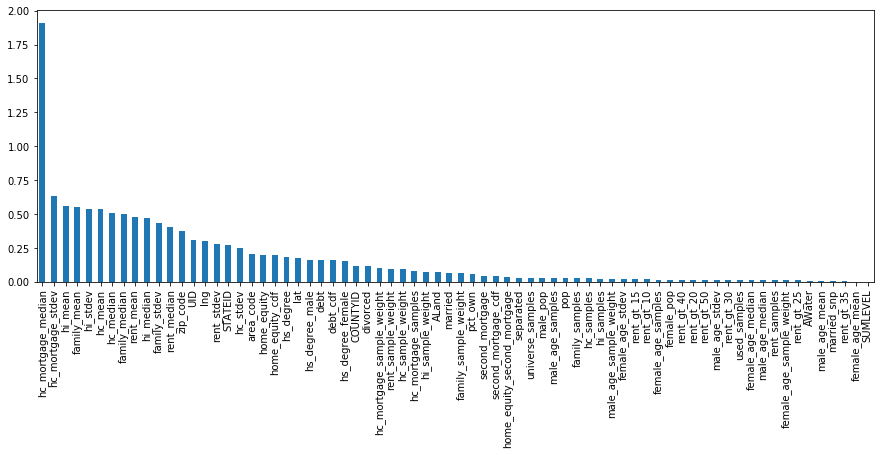

In [35]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15,5))

In [36]:
best_features=mutual_info.sort_values(ascending=False)

In [37]:
type(best_features)

pandas.core.series.Series

In [44]:
df_features=pd.DataFrame(best_features,columns=['Feature_score'])

In [45]:
df_features.head(60)

,Feature_score
hc_mortgage_median,1.908676
hc_mortgage_stdev,0.634414
hi_mean,0.563297
family_mean,0.549243
hi_stdev,0.540083
hc_mean,0.538737
hc_median,0.506707
family_median,0.499236
rent_mean,0.481026
hi_median,0.475008


In [23]:
df[['home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt','second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf','pct_own']].head(10)

,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,pct_own
0,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.79046
1,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.52483
2,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.85331
3,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.65037
4,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,0.13046
5,0.00000,0.00000,0.05991,0.43721,1.00000,0.62900,0.85639,0.83215
6,0.00000,0.00000,0.00000,0.34370,1.00000,1.00000,0.92825,0.77658
7,0.03355,0.03355,0.09665,0.49681,0.31734,0.45654,0.78390,0.89931
8,0.02331,0.02331,0.11441,0.68644,0.41132,0.37760,0.40090,0.59602
9,0.01229,0.02809,0.21247,0.61633,0.36543,0.09640,0.56452,0.73651


### Exploratory Data Analysis (EDA):

### Perform debt analysis. 

 a) Explore the top 2,500 locations where the percentage of households with a second mortgage is the highest and percent ownership is above 10 percent. Visualize using geo-map. You may keep the upper limit for the percent of households with a second mortgage to 50 percent

b) Use the following bad debt equation: Bad Debt = P (Second Mortgage ∩ Home Equity Loan) Bad Debt = second_mortgage + home_equity - home_equity_second_mortgage c) Create pie charts to show overall debt and bad debt

d) Create Box and whisker plot and analyze the distribution for 2nd mortgage, home equity, good debt, and bad debt for different cities

e) Create a collated income distribution chart for family income, house hold income, and remaining income 

In [50]:
#df.sort_values(['second_mortgage'],ascending=False).head(2500)

In [53]:
df_loc_mortgage=df[['COUNTYID', 'STATEID', 'state', 'state_ab', 'city','place', 'zip_code', 'area_code', 'lat', 'lng','home_equity_second_mortgage', 'second_mortgage','home_equity','debt','pct_own']]


In [54]:
df_loc_mortgage.head()

,COUNTYID,STATEID,state,state_ab,city,place,zip_code,area_code,lat,lng,home_equity_second_mortgage,second_mortgage,home_equity,debt,pct_own
0,53,36,New York,NY,Hamilton,Hamilton,13346,315,42.840812,-75.501524,0.01588,0.02077,0.08919,0.52963,0.79046
1,141,18,Indiana,IN,South Bend,Roseland,46616,574,41.701441,-86.266614,0.02222,0.02222,0.04274,0.60855,0.52483
2,63,18,Indiana,IN,Danville,Danville,46122,317,39.792202,-86.515246,0.00000,0.00000,0.09512,0.73484,0.85331
3,127,72,Puerto Rico,PR,San Juan,Guaynabo,927,787,18.396103,-66.104169,0.01086,0.01086,0.01086,0.52714,0.65037
4,161,20,Kansas,KS,Manhattan,Manhattan City,66502,785,39.195573,-96.569366,0.05426,0.05426,0.05426,0.51938,0.13046


In [55]:
df_loc_high_mortgage=df_loc_mortgage[df_loc_mortgage['pct_own']>0.1].sort_values(['second_mortgage'],ascending=False)

In [56]:
df_loc_high_mortgage_top2500=df_loc_high_mortgage.head(2500)

In [57]:
df_loc_high_mortgage_top2500

,COUNTYID,STATEID,state,state_ab,city,place,zip_code,area_code,lat,lng,home_equity_second_mortgage,second_mortgage,home_equity,debt,pct_own
3285,147,51,Virginia,VA,Farmville,Farmville,23901,434,37.297357,-78.396452,0.00000,0.50000,0.00000,0.50000,0.62069
11980,27,25,Massachusetts,MA,Worcester,Worcester City,1610,508,42.254262,-71.800347,0.43363,0.43363,0.43363,0.84956,0.20247
26018,81,36,New York,NY,Corona,Harbor Hills,11368,718,40.751809,-73.853582,0.31818,0.31818,0.40341,0.78409,0.15618
7829,3,24,Maryland,MD,Glen Burnie,Glen Burnie,21061,410,39.127273,-76.635265,0.27739,0.30212,0.35689,0.87633,0.22380
2077,57,12,Florida,FL,Tampa,Egypt Lake-leto,33614,813,28.029063,-82.495395,0.28972,0.28972,0.38785,0.78972,0.11618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24443,77,6,California,CA,Manteca,Manteca City,95336,209,37.732143,-121.242902,0.06814,0.06814,0.16831,0.71100,0.67116
8377,86,12,Florida,FL,Cutler Bay,Cutler Bay,33189,305,25.550391,-80.347791,0.06813,0.06813,0.10341,0.84550,0.50519
16621,439,48,Texas,TX,Keller,Keller City,76248,817,32.913822,-97.204310,0.06125,0.06812,0.13623,0.84087,0.97987
13987,17,39,Ohio,OH,Middletown,Jacksonburg,45042,513,39.556756,-84.443252,0.06812,0.06812,0.19482,0.72956,0.92888


In [58]:
df_loc_high_mortgage_top2500_lim=df_loc_high_mortgage_top2500[df_loc_high_mortgage_top2500['second_mortgage']<0.5]

In [59]:
df_loc_high_mortgage_top2500_lim

,COUNTYID,STATEID,state,state_ab,city,place,zip_code,area_code,lat,lng,home_equity_second_mortgage,second_mortgage,home_equity,debt,pct_own
11980,27,25,Massachusetts,MA,Worcester,Worcester City,1610,508,42.254262,-71.800347,0.43363,0.43363,0.43363,0.84956,0.20247
26018,81,36,New York,NY,Corona,Harbor Hills,11368,718,40.751809,-73.853582,0.31818,0.31818,0.40341,0.78409,0.15618
7829,3,24,Maryland,MD,Glen Burnie,Glen Burnie,21061,410,39.127273,-76.635265,0.27739,0.30212,0.35689,0.87633,0.22380
2077,57,12,Florida,FL,Tampa,Egypt Lake-leto,33614,813,28.029063,-82.495395,0.28972,0.28972,0.38785,0.78972,0.11618
1701,31,17,Illinois,IL,Chicago,Lincolnwood,60640,773,41.967289,-87.652434,0.28899,0.28899,0.40826,0.83945,0.14228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24443,77,6,California,CA,Manteca,Manteca City,95336,209,37.732143,-121.242902,0.06814,0.06814,0.16831,0.71100,0.67116
8377,86,12,Florida,FL,Cutler Bay,Cutler Bay,33189,305,25.550391,-80.347791,0.06813,0.06813,0.10341,0.84550,0.50519
16621,439,48,Texas,TX,Keller,Keller City,76248,817,32.913822,-97.204310,0.06125,0.06812,0.13623,0.84087,0.97987
13987,17,39,Ohio,OH,Middletown,Jacksonburg,45042,513,39.556756,-84.443252,0.06812,0.06812,0.19482,0.72956,0.92888


### Visualize using geo-map

In [46]:
!conda install -c conda-forge folium=0.5.0 --yes
import folium

print('Folium installed and imported!')

Solving environment: ...working... done

# All requested packages already installed.

Folium installed and imported!


In [47]:
# define the world map
world_map = folium.Map()

# display world map
world_map

### define the world map centered around America with a low zoom level.

In [48]:

USA_map = folium.Map(location=[37.09024,-95.712891], zoom_start=6)

USA_map


In [ ]:
#LayerControl
 mapa.add_child(feature_group)
mapa.add_child(LayerControl())

folium.LayerControl().add_to(mapa)


In [ ]:
mortgage = folium.map.FeatureGroup()

for lat, lng, in zip(df_loc_high_mortgage_top2500_lim.lat, df_loc_high_mortgage_top2500_lim.lng):
    mortgage.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

In [64]:
# instantiate a feature group for the mortgage in the dataframe


# add pop-up text to each marker on the map
latitudes = list(df_loc_high_mortgage_top2500_lim.lat)
longitudes = list(df_loc_high_mortgage_top2500_lim.lng)
labels = list(df_loc_high_mortgage_top2500_lim.city)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(USA_map)    
    
# add second_mortgage to map
#USA_map.add_child(mortgage)

#folium.LayerControl().add_to(USA_map)


In [65]:
USA_map

### Bad Debt = P (Second Mortgage ∩ Home Equity Loan) 
### bad Debt = second_mortgage + home_equity - home_equity_second_mortgage
### Create pie charts to show overall debt and bad debt

In [36]:
df_loc_high_mortgage_top2500_lim['bad_debt']=df_loc_high_mortgage_top2500_lim['second_mortgage']+df_loc_high_mortgage_top2500_lim['home_equity']-df_loc_high_mortgage_top2500_lim['home_equity_second_mortgage']

C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [37]:
df_loc_high_mortgage_top2500_lim.head()

,COUNTYID,STATEID,state,state_ab,city,place,zip_code,area_code,lat,lng,home_equity_second_mortgage,second_mortgage,home_equity,debt,pct_own,bad_debt
11980,27,25,Massachusetts,MA,Worcester,Worcester City,1610,508,42.254262,-71.800347,0.43363,0.43363,0.43363,0.84956,0.20247,0.43363
26018,81,36,New York,NY,Corona,Harbor Hills,11368,718,40.751809,-73.853582,0.31818,0.31818,0.40341,0.78409,0.15618,0.40341
7829,3,24,Maryland,MD,Glen Burnie,Glen Burnie,21061,410,39.127273,-76.635265,0.27739,0.30212,0.35689,0.87633,0.22380,0.38162
2077,57,12,Florida,FL,Tampa,Egypt Lake-leto,33614,813,28.029063,-82.495395,0.28972,0.28972,0.38785,0.78972,0.11618,0.38785
1701,31,17,Illinois,IL,Chicago,Lincolnwood,60640,773,41.967289,-87.652434,0.28899,0.28899,0.40826,0.83945,0.14228,0.40826


In [38]:
df_overall_debt_vs_baddebt=df_loc_high_mortgage_top2500_lim[['debt','bad_debt']].sum()

In [39]:
df_overall_debt_vs_baddebt

debt        1841.48659
bad_debt     446.30239
dtype: float64

In [40]:
type(df_overall_debt_vs_baddebt)

pandas.core.series.Series

In [41]:
df_overall_debt_badDebt=pd.DataFrame(df_overall_debt_vs_baddebt,columns=['agg_debt_vs_badDebt'])

In [42]:
df_overall_debt_badDebt

,agg_debt_vs_badDebt
debt,1841.48659
bad_debt,446.30239


In [ ]:
# Create Pie chart to show overall debt and bad debt for different cities.

C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


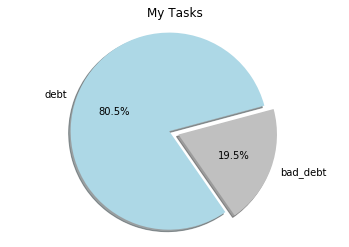

In [43]:




my_labels = ['debt','bad_debt']

my_colors = ['lightblue','silver']
my_explode = (0, 0.1)
plt.pie(df_overall_debt_badDebt, labels=my_labels, autopct='%1.1f%%', startangle=15, shadow = True,explode=my_explode, colors=my_colors)
plt.title('My Tasks')
plt.axis('equal')
plt.show()

###  Create Box and whisker plot and analyze the distribution for 2nd mortgage, 
### home equity, good debt, and bad debt for different cities

In [44]:
len(df_loc_high_mortgage_top2500_lim['city'].unique())

1171

In [45]:
cities=df_loc_high_mortgage_top2500_lim['city']

In [46]:
type(cities)

pandas.core.series.Series

In [47]:
cities

11980       Worcester
26018          Corona
7829      Glen Burnie
2077            Tampa
1701          Chicago
             ...     
24443         Manteca
8377       Cutler Bay
16621          Keller
13987      Middletown
14857    Mays Landing
Name: city, Length: 2499, dtype: object

In [48]:
#cities.to_list()

In [49]:
grouped = df_loc_high_mortgage_top2500_lim.groupby('city')
#grouped.boxplot(rot=45, fontsize=12, figsize=(8,10))

In [50]:
grouped.get_group('Tampa')

,COUNTYID,STATEID,state,state_ab,city,place,zip_code,area_code,lat,lng,home_equity_second_mortgage,second_mortgage,home_equity,debt,pct_own,bad_debt
2077,57,12,Florida,FL,Tampa,Egypt Lake-leto,33614,813,28.029063,-82.495395,0.28972,0.28972,0.38785,0.78972,0.11618,0.38785
5525,57,12,Florida,FL,Tampa,Northdale,33618,813,28.103064,-82.508636,0.10791,0.10791,0.33094,0.79317,0.26693,0.33094
1294,57,12,Florida,FL,Tampa,Citrus Park,33625,813,28.052695,-82.556942,0.01313,0.10637,0.06894,0.80302,0.65168,0.16218
22429,57,12,Florida,FL,Tampa,University,33612,813,28.037689,-82.438782,0.02590,0.09655,0.05102,0.63736,0.46040,0.12167
10687,57,12,Florida,FL,Tampa,Northdale,33624,813,28.091286,-82.528049,0.04938,0.08262,0.20038,0.82906,0.82478,0.23362
7471,57,12,Florida,FL,Tampa,Temple Terrace City,33617,813,28.048477,-82.413138,0.08108,0.08108,0.08108,0.76834,0.27069,0.08108
7545,57,12,Florida,FL,Tampa,University,33613,813,28.092008,-82.419980,0.06256,0.07234,0.13196,0.71848,0.48386,0.14174


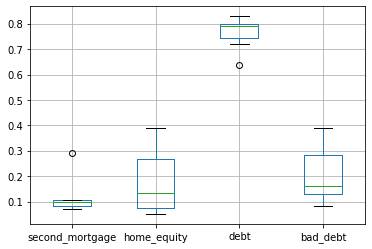

In [51]:
boxplot = grouped.get_group('Tampa').boxplot(column=['second_mortgage','home_equity', 'debt','bad_debt'])

In [52]:
Cities=cities.tolist()

In [53]:
Cities

['Worcester',
 'Corona',
 'Glen Burnie',
 'Tampa',
 'Chicago',
 'Chicago',
 'Milwaukee',
 'Etiwanda',
 'South San Francisco',
 'Cincinnati',
 'Dallas',
 'Colorado Springs',
 'Littleton',
 'Napa',
 'East Cleveland',
 'Highland Park',
 'Fairfield',
 'Washington',
 'Hartford',
 'Chicago',
 'Los Angeles',
 'Happy Valley',
 'Winder',
 'Orlando',
 'San Pedro',
 'Jackson',
 'Watertown',
 'Tacoma',
 'Hyattsville',
 'Oxford',
 'Murrieta',
 'New Castle',
 'Oldsmar',
 'Hollywood',
 'Denver',
 'Yonkers',
 'Westminster',
 'Hartford',
 'Jamaica',
 'Emeryville',
 'Washington',
 'Painesville',
 'Pineville',
 'Buena Park',
 'Gridley',
 'Riverside',
 'Henderson',
 'National City',
 'Brooklyn',
 'Cincinnati',
 'Sacramento',
 'Lynwood',
 'Troy',
 'Upper Darby',
 'Santa Clara',
 'Las Vegas',
 'Orlando',
 'Sacramento',
 'Mapleton',
 'Seattle',
 'San Pedro',
 'Los Angeles',
 'West New York',
 'Vancouver',
 'Cincinnati',
 'Chatsworth',
 'Sherman Oaks',
 'Cheyenne',
 'Washington',
 'Antelope',
 'Johnson City',

 Enter city:
Tampa
Box plot for {}: x


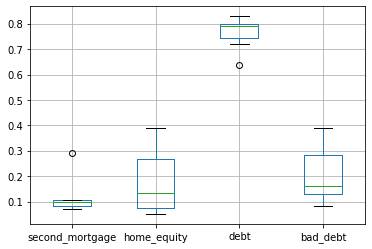

In [54]:
print(" Enter city:")

x=input()

if x in Cities :
    print("Box plot for {}:",'x')
    boxplot = grouped.get_group(x).boxplot(column=['second_mortgage','home_equity', 'debt','bad_debt'])
    
else:
    print(" Enter City name from the list...")

### Create a collated income distribution chart for family income, house hold income, and remaining income.

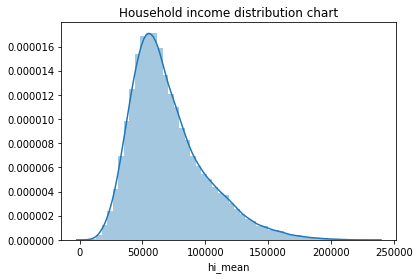

In [55]:
sns.distplot(df['hi_mean'])
plt.title('Household income distribution chart')
plt.show()

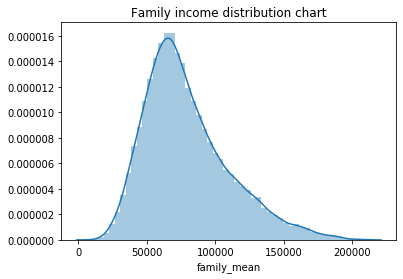

In [56]:
sns.distplot(df['family_mean'])
plt.title('Family income distribution chart')
plt.show()

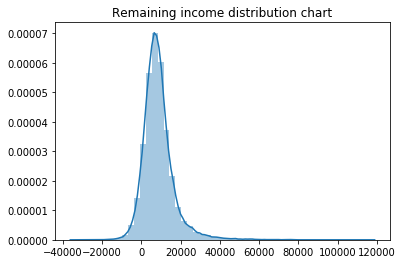

In [57]:
sns.distplot(df['family_mean']-df['hi_mean'])
plt.title('Remaining income distribution chart')
plt.show()

## Exploratory Data Analysis:

### Perform EDA and come out with insights into population density and age. 
### You may have to derive new fields (make sure to weight averages for accurate measurements):

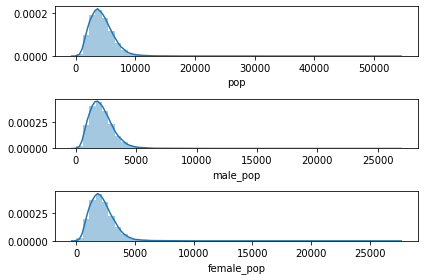

In [58]:
fig,(ax1,ax2,ax3)=plt.subplots(3,1)
sns.distplot(df['pop'],ax=ax1)
sns.distplot(df['male_pop'],ax=ax2)
sns.distplot(df['female_pop'],ax=ax3)
plt.subplots_adjust(wspace=0.8,hspace=0.8)
plt.tight_layout()
plt.show()

<Figure size 1800x720 with 0 Axes>

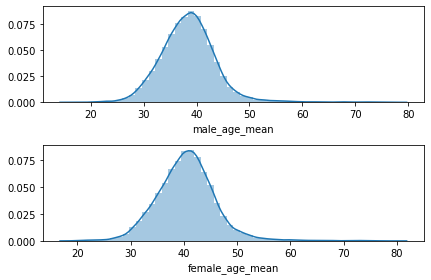

In [59]:
plt.figure(figsize=(25,10))
fig,(ax1,ax2)=plt.subplots(2,1)
sns.distplot(df['male_age_mean'],ax=ax1)
sns.distplot(df['female_age_mean'],ax=ax2)
plt.subplots_adjust(wspace=0.8,hspace=0.8)
plt.tight_layout()
plt.show()

### Use pop and ALand variables to create a new field called population density.

In [60]:
df['pop_density']=df['pop']/df['ALand']

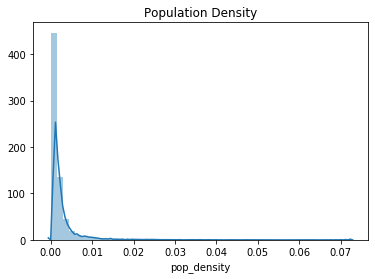

In [61]:
sns.distplot(df['pop_density'])
plt.title('Population Density')
plt.show() 
# Very less density is noticed

### Use male_age_median, female_age_median, male_pop, and 
### female_pop to create a new field called median age c) Visualize the findings using appropriate chart type.

In [62]:
df['age_median']=(df['male_age_median']+df['female_age_median'])/2


In [63]:
df[['male_age_median','female_age_median','male_pop','female_pop','age_median']].head()

,male_age_median,female_age_median,male_pop,female_pop,age_median
0,44.00000,45.33333,2612,2618,44.666665
1,32.00000,37.58333,1349,1284,34.791665
2,40.83333,42.83333,3643,3238,41.833330
3,48.91667,50.58333,1141,1559,49.750000
4,22.41667,21.58333,2586,3051,22.000000


###  Visualize the findings using appropriate chart type.

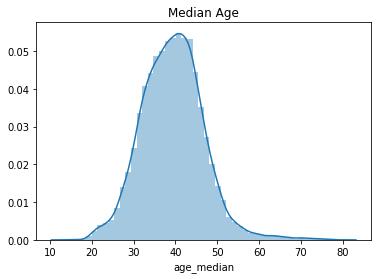

In [64]:
sns.distplot(df['age_median'])
plt.title('Median Age')
plt.show()

###  Age of population is mostly between 20 and 60
### Majority are of age around 40
### Median age distribution has a gaussian distribution
### Some right skewness is noticed.

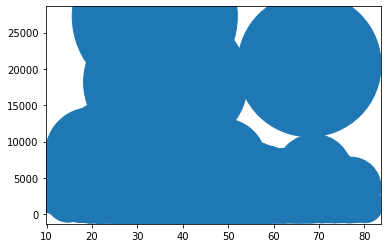

In [65]:

plt.scatter(df['female_age_median'], df['female_pop'], s=df['female_pop'])
plt.show()

No handles with labels found to put in legend.


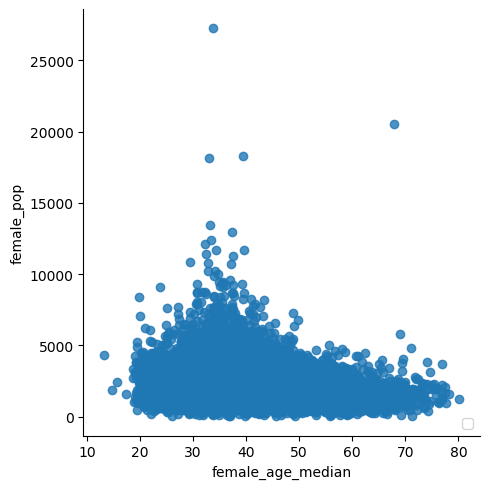

In [66]:

#plt.figure(figsize=(6,3))
plt.rcParams.update({'figure.figsize':(10,8), 'figure.dpi':100})
# Use the 'palette' argument
sns.lmplot( x="female_age_median", y="female_pop", data=df, fit_reg=False, legend=False)
 
# Move the legend to an empty part of the plot
plt.legend(loc='lower right')
 
plt.show()

 Enter city:
Tampa
Scatter plot for female age median vs female population for {} city  a


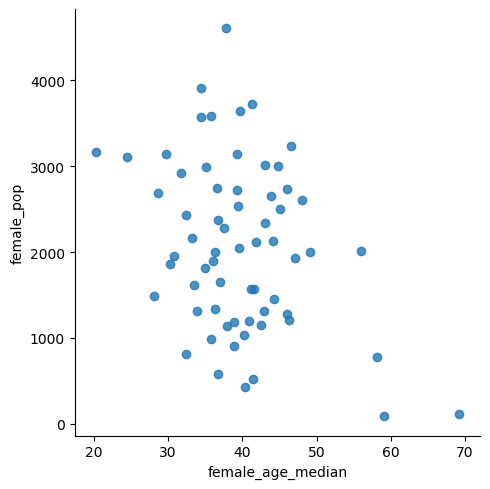

In [67]:
print(" Enter city:")

a=input()

if a in Cities :
    print("Scatter plot for female age median vs female population for {} city ", 'a')
    
    plt.rcParams.update({'figure.figsize':(10,8), 'figure.dpi':100})

    sns.lmplot( x="female_age_median", y="female_pop", data=df[df['city']==a],fit_reg=False, legend=False)
 

    plt.show()
    
else:
    print(" Enter  the right City name from the list...")

 Enter city:
Tampa
Scatter plot for female age median vs female population for {} city  a


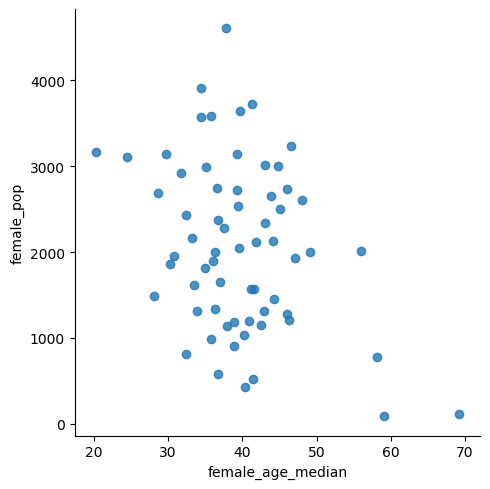

In [68]:
print(" Enter city:")

a=input()

if a in Cities :
    print("Scatter plot for female age median vs female population for {} city ", 'a')
    
    plt.rcParams.update({'figure.figsize':(10,8), 'figure.dpi':100})

    sns.lmplot( x="female_age_median", y="female_pop", data=df[df['city']==a],fit_reg=False, legend=False)
 

    plt.show()
    
else:
    print(" Enter  the right City name from the list...")

### Create bins for population into a new variable by selecting appropriate class interval so that the number of categories  don’t exceed 5 for the ease of analysis.

In [69]:
df['pop'].describe()

count    26585.000000
mean      4367.763438
std       2093.787018
min         63.000000
25%       2938.000000
50%       4078.000000
75%       5456.000000
max      53812.000000
Name: pop, dtype: float64

In [70]:
df['pop_bins']=pd.cut(df['pop'],bins=5,labels=['very low','low','medium','high','very high'])

In [71]:
df[['pop','pop_bins']]

,pop,pop_bins
0,5230,very low
1,2633,very low
2,6881,very low
3,2700,very low
4,5637,very low
...,...,...
27316,1847,very low
27317,4155,very low
27318,2829,very low
27319,11542,low


In [72]:
df['pop_bins'].value_counts()

very low     26334
low            238
medium           9
high             3
very high        1
Name: pop_bins, dtype: int64

### Analyze the married, separated, and divorced population for these population brackets.

In [73]:
df.groupby(by='pop_bins')[['married','separated','divorced']].count()

,married,separated,divorced
pop_bins,,,
very low,26334,26334,26334
low,238,238,238
medium,9,9,9
high,3,3,3
very high,1,1,1


In [74]:
df.groupby(by='pop_bins')[['married','separated','divorced']].agg(["mean", "median"])

married           separated           divorced          
               mean    median      mean   median      mean    median
pop_bins                                                            
very low   0.511869  0.528105  0.019017  0.01351  0.101048  0.096090
low        0.584691  0.592575  0.015655  0.01106  0.075749  0.070565
medium     0.655737  0.618710  0.005003  0.00412  0.065927  0.064890
high       0.726957  0.736060  0.015663  0.00916  0.077310  0.063050
very high  0.734740  0.734740  0.004050  0.00405  0.030360  0.030360

### Very high population group has more married people and less percantage of separated and divorced couples In very low population groups, there are more divorced people

### Visualize using appropriate chart type

<Figure size 1000x500 with 0 Axes>

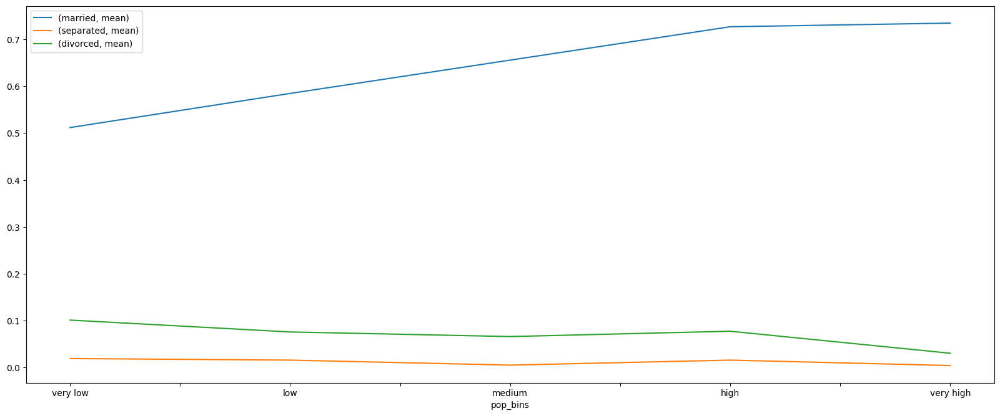

In [75]:
plt.figure(figsize=(10,5))
pop_bin_married=df.groupby(by='pop_bins')[['married','separated','divorced']].agg(["mean"])
pop_bin_married.plot(figsize=(20,8))
plt.legend(loc='best')
plt.show()

### Please detail your observations for rent as a percentage of income at an overall level, and for different states.

In [76]:
rent_state_mean=df.groupby(by='state')['rent_mean'].agg(["mean"])
rent_state_mean.head()

,mean
state,
Alabama,768.810406
Alaska,1173.830410
Arizona,1101.133798
Arkansas,715.367386
California,1479.363998


In [77]:
income_state_mean=df.groupby(by='state')['family_mean'].agg(["mean"])
income_state_mean.head()

,mean
state,
Alabama,66814.665178
Alaska,92504.826703
Arizona,73546.551858
Arkansas,64046.416919
California,88438.468548


In [78]:
rent_perc_of_income=rent_state_mean['mean']/income_state_mean['mean']
rent_perc_of_income.head(10)

state
Alabama                 0.011507
Alaska                  0.012689
Arizona                 0.014972
Arkansas                0.011170
California              0.016728
Colorado                0.013547
Connecticut             0.012573
Delaware                0.012929
District of Columbia    0.012947
Florida                 0.015795
Name: mean, dtype: float64

### overall level rent as a percentage of income


In [79]:

sum(df['rent_mean'])/sum(df['family_mean'])

0.013298927951198152

## Perform correlation analysis for all the relevant variables by creating a heatmap. Describe your findings.

In [80]:
df.columns

Index(['UID', 'SUMLEVEL', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'zip_code', 'area_code', 'lat', 'lng', 'ALand',
       'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree

In [81]:
cor=df[['COUNTYID','STATEID','zip_code','pop', 'family_mean',
         'second_mortgage', 'home_equity', 'debt','hs_degree',
           'age_median','pct_own', 'married','separated', 'divorced','hc_mortgage_mean']].corr()

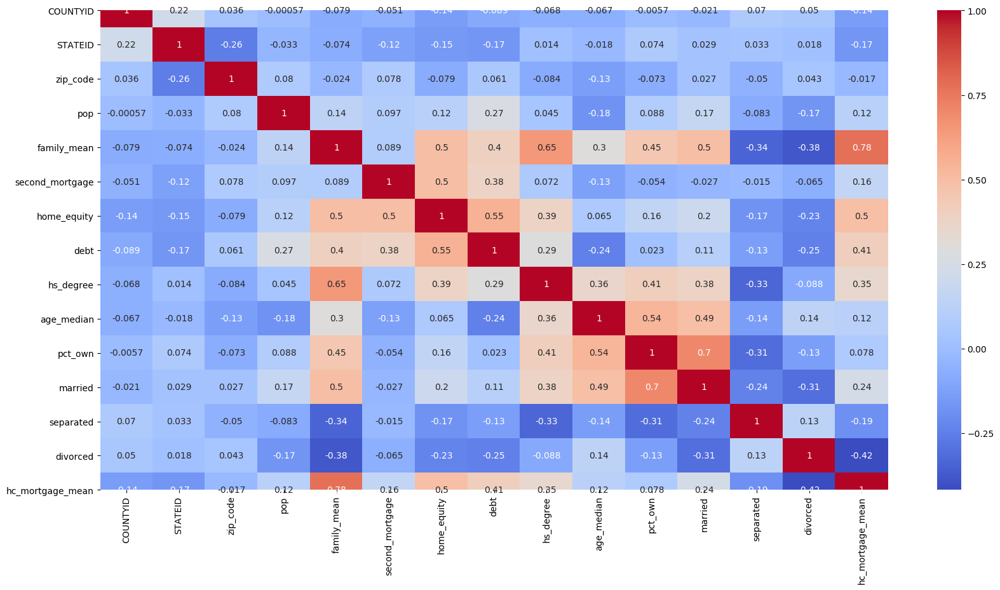

In [82]:
plt.figure(figsize=(20,10))
sns.heatmap(cor,annot=True,cmap='coolwarm')
plt.show()

### High positive correaltion is noticed between pop, male_pop and female_pop
### High positive correaltion is noticed between rent_mean,hi_mean, family_mean,hc_mean

In [84]:
cor=df[['COUNTYID','STATEID','zip_code','type','pop','ALand','AWater','male_pop','female_pop','family_mean','rent_median','hi_median',
         'second_mortgage', 'home_equity', 'debt','hs_degree',
           'age_median','pct_own', 'married','separated', 'divorced']].corr()

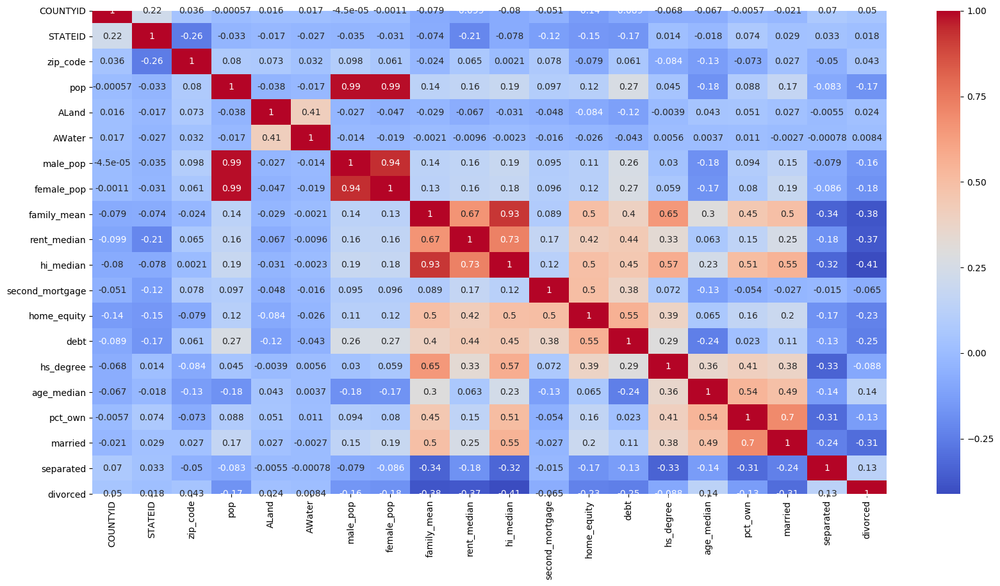

In [85]:
plt.figure(figsize=(20,10))
sns.heatmap(cor,annot=True,cmap='coolwarm')
plt.show()

## Data Pre processing:

### 1. The economic multivariate data has a significant number of measured variables. The goal is to find where the measured variables depend on a number of smaller unobserved common factors or latent variables. 2. Each variable is assumed to be dependent upon a linear combination of the common factors, and the coefficients are known as loadings. Each measured variable also includes a component due to independent random variability, known as “specific variance” because it is specific to one variable. Obtain the common factors and then plot the loadings. Use factor analysis to find latent variables in our dataset and gain insight into the linear relationships in the data. Following are the list of latent variables:

### • Highschool graduation rates •Median population age • Second mortgage statistics • Percent own • Bad debt expense.

## Data Modeling : Linear Regression.


### Build a linear Regression model to predict the total monthly expenditure for home mortgages loan. Please refer ‘deplotment_RE.xlsx’. Column hc_mortgage_mean is predicted variable. This is the mean monthly mortgage and owner costs of specified geographical location. Note: Exclude loans from prediction model which have NaN (Not a Number) values for hc_mortgage_mean.

In [86]:
df.columns

Index(['UID', 'SUMLEVEL', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'zip_code', 'area_code', 'lat', 'lng', 'ALand',
       'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree

In [87]:
df['type'].unique()

array(['City', 'Urban', 'Town', 'CDP', 'Village', 'Borough'], dtype=object)

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26585 entries, 0 to 27320
Data columns (total 81 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   UID                          26585 non-null  int64   
 1   SUMLEVEL                     26585 non-null  int64   
 2   COUNTYID                     26585 non-null  int64   
 3   STATEID                      26585 non-null  int64   
 4   state                        26585 non-null  object  
 5   state_ab                     26585 non-null  object  
 6   city                         26585 non-null  object  
 7   place                        26585 non-null  object  
 8   type                         26585 non-null  object  
 9   zip_code                     26585 non-null  int64   
 10  area_code                    26585 non-null  int64   
 11  lat                          26585 non-null  float64 
 12  lng                          26585 non-null  float64 
 13  A

In [89]:
cor=df[['COUNTYID','STATEID','zip_code','type','pop','ALand','AWater','male_pop','female_pop','family_mean','rent_median','hi_median',
         'second_mortgage', 'home_equity', 'debt','hs_degree',
           'age_median','pct_own', 'married','separated', 'divorced','hc_mortgage_mean']].corr()

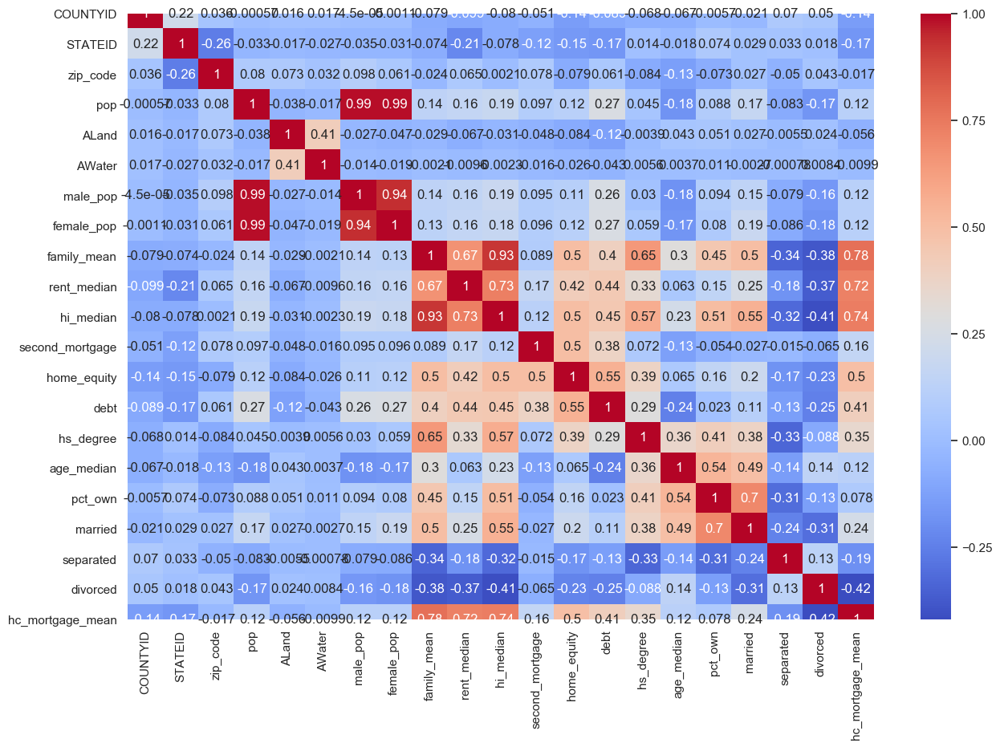

In [90]:
sns.set(style="white", color_codes=True)
sns.set(font_scale=1.0)

plt.figure(figsize=(15,10))
sns.heatmap(cor,annot=True,cmap='coolwarm')
plt.show()

In [91]:
cor1=df[['COUNTYID','STATEID','zip_code','type','pop','ALand','AWater','male_pop','female_pop','family_mean','rent_median','hi_median',
         'second_mortgage', 'home_equity', 'debt','hs_degree',
           'age_median','pct_own', 'married','separated', 'divorced','hc_mortgage_mean']]

In [1]:
#sns.pairplot(cor1)

In [ ]:
cor2=df[['pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
               'married','separated', 'divorced','hc_mortgage_mean']]

In [ ]:
sns.pairplot(cor2)

### Run a model at a Nation level.

In [93]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error,mean_squared_error,accuracy_score

C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
C:\Users\shehz\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-note

In [94]:
feature_cols=['pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
              'pct_own', 'married','separated', 'divorced','hc_mortgage_mean']

In [95]:
df[feature_cols].head()

,pop,family_mean,rent_median,hi_median,second_mortgage,home_equity,debt,hs_degree,age_median,pct_own,married,separated,divorced,hc_mortgage_mean
0,5230,67994.14790,784.0,48120.0,0.02077,0.08919,0.52963,0.89288,44.666665,0.79046,0.57851,0.01240,0.08770,1414.80295
1,2633,50670.10337,848.0,35186.0,0.02222,0.04274,0.60855,0.90487,34.791665,0.52483,0.34886,0.01426,0.09030,864.41390
2,6881,95262.51431,703.0,74964.0,0.00000,0.09512,0.73484,0.94288,41.833330,0.85331,0.64745,0.01607,0.10657,1506.06758
3,2700,56401.68133,782.0,37845.0,0.01086,0.01086,0.52714,0.91500,49.750000,0.65037,0.47257,0.02021,0.10106,1175.28642
4,5637,54053.42396,881.0,22497.0,0.05426,0.05426,0.51938,1.00000,22.000000,0.13046,0.12356,0.00000,0.03109,1192.58759


In [96]:
#df[feature_cols].shape

In [97]:
X=df[feature_cols]
y=df[['hc_mortgage_mean']]

In [98]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=42)

In [99]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error,mean_squared_error,accuracy_score

In [100]:
sc=StandardScaler()
x_train_scaled=sc.fit_transform(X_train)


In [101]:
x_test_scaled=sc.transform(X_test)

In [103]:
X_train.head()

,pop,family_mean,rent_median,hi_median,second_mortgage,home_equity,debt,hs_degree,age_median,pct_own,married,separated,divorced,hc_mortgage_mean
22628,6518,53645.58544,1018.0,41261.0,0.13598,0.13598,0.74221,0.66216,28.666665,0.16613,0.40733,0.00402,0.10347,2191.82243
14186,1906,31950.11880,543.0,17114.0,0.00000,0.10324,0.30088,0.85679,36.375000,0.47482,0.24370,0.05210,0.12101,1880.41134
15155,7307,68923.34425,680.0,49140.0,0.00000,0.01798,0.33295,0.81054,38.000000,0.63761,0.49948,0.03550,0.09445,1406.81262
20613,2433,81882.56787,537.0,58169.0,0.01179,0.05778,0.55896,0.89367,42.291670,0.89786,0.66353,0.02717,0.10867,1622.50442
18226,6172,85592.76946,1188.0,57514.0,0.00000,0.11740,0.85535,0.96609,38.875000,0.42500,0.51747,0.01681,0.06855,1469.35841


In [104]:
linereg=LinearRegression()
linereg.fit(x_train_scaled,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [105]:
x_train_scaled.shape

(21268, 14)

In [106]:
y_train.shape

(21268, 1)

In [107]:
y_pred=linereg.predict(x_test_scaled)

In [108]:
print("Overall R2 score of linear regression model", r2_score(y_test,y_pred))
print("Overall RMSE of linear regression model", np.sqrt(mean_squared_error(y_test,y_pred)))

Overall R2 score of linear regression model 1.0
Overall RMSE of linear regression model 6.311937496253607e-13


### Run another model at State level. There are 52 states in USA.

In [109]:
df_states=df[['STATEID','state','pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
               'married','separated', 'divorced','hc_mortgage_mean']]

In [110]:
df_states.head()

,STATEID,state,pop,family_mean,rent_median,hi_median,second_mortgage,home_equity,debt,hs_degree,age_median,married,separated,divorced,hc_mortgage_mean
0,36,New York,5230,67994.14790,784.0,48120.0,0.02077,0.08919,0.52963,0.89288,44.666665,0.57851,0.01240,0.08770,1414.80295
1,18,Indiana,2633,50670.10337,848.0,35186.0,0.02222,0.04274,0.60855,0.90487,34.791665,0.34886,0.01426,0.09030,864.41390
2,18,Indiana,6881,95262.51431,703.0,74964.0,0.00000,0.09512,0.73484,0.94288,41.833330,0.64745,0.01607,0.10657,1506.06758
3,72,Puerto Rico,2700,56401.68133,782.0,37845.0,0.01086,0.01086,0.52714,0.91500,49.750000,0.47257,0.02021,0.10106,1175.28642
4,20,Kansas,5637,54053.42396,881.0,22497.0,0.05426,0.05426,0.51938,1.00000,22.000000,0.12356,0.00000,0.03109,1192.58759


In [111]:
df_states['STATEID'].nunique()

52

In [112]:
df_states[['STATEID']].value_counts()

STATEID
6          2826
48         1876
36         1683
12         1569
42         1203
17         1096
39         1074
26         1016
37          809
13          757
34          684
51          667
18          565
25          538
53          536
55          531
4           523
24          513
47          508
27          496
29          488
8           463
22          420
1           407
45          389
21          387
40          365
9           321
41          321
72          300
20          295
19          287
5           264
28          242
32          239
49          224
35          195
31          185
54          168
23          130
30          117
15          113
33          111
16          101
44           89
46           89
38           79
2            74
10           71
11           63
50           62
56           56
dtype: int64

### Dataframe State wise group

In [113]:
df_statewise=df_states.groupby(['state'])

In [114]:
df_statewise.get_group('New York')

,STATEID,state,pop,family_mean,rent_median,hi_median,second_mortgage,home_equity,debt,hs_degree,age_median,married,separated,divorced,hc_mortgage_mean
0,36,New York,5230,67994.14790,784.0,48120.0,0.02077,0.08919,0.52963,0.89288,44.666665,0.57851,0.01240,0.08770,1414.80295
8,36,New York,3530,69349.72400,1501.0,44906.0,0.02331,0.11441,0.68644,0.76310,34.000000,0.52974,0.02309,0.05318,2941.26980
19,36,New York,3623,57755.33528,1227.0,31972.0,0.00000,0.06220,0.65072,0.65335,29.791670,0.55029,0.00491,0.04742,2974.53585
44,36,New York,8953,107719.74870,932.0,42517.0,0.00000,0.07087,0.51496,0.95043,20.208335,0.14142,0.00187,0.01309,1891.52656
47,36,New York,3984,69928.45206,746.0,51815.0,0.00767,0.07843,0.46718,0.88433,44.125000,0.53957,0.04209,0.08668,1470.04202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27250,36,New York,1727,63461.47568,734.0,49527.0,0.00000,0.05074,0.59197,0.88750,38.625000,0.49051,0.02628,0.09489,1169.50783
27260,36,New York,1841,106428.67660,1375.0,70990.0,0.00750,0.04000,0.59250,0.92047,35.833335,0.52200,0.00000,0.05311,2358.94363
27279,36,New York,3483,112836.27450,2109.0,97719.0,0.04521,0.17438,0.77503,0.93433,37.458335,0.59465,0.01188,0.03489,2479.05597
27284,36,New York,6796,118885.48140,1988.0,96094.0,0.01348,0.06419,0.65912,0.90878,42.916665,0.66050,0.00604,0.05438,2252.87251


In [ ]:
df_groups=df_statewise.get_group('New York')

In [ ]:
df_stateX=df_groups[['pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
               'married','separated', 'divorced']]

In [ ]:
df_stateX

In [ ]:
df_stateX.shape

In [ ]:
df_stateY=df_groups[['hc_mortgage_mean']]

In [ ]:
df_stateY.shape

In [ ]:
x_train, x_test, y_train, y_test = train_test_split( df_stateX, df_stateY, test_size=0.2, random_state=42)

In [ ]:
sc=StandardScaler()
x_train_scaled=sc.fit_transform(x_train)


In [ ]:
x_test_scaled=sc.transform(x_test)

In [ ]:
linereg=LinearRegression()
linereg.fit(x_train_scaled,y_train)

In [ ]:
y_pred=linereg.predict(x_test_scaled)

In [ ]:
print("Overall R2 score of linear regression model", r2_score(y_test,y_pred))
print("Overall RMSE of linear regression model", np.sqrt(mean_squared_error(y_test,y_pred)))

In [ ]:
### For StateID = 50

In [ ]:
for name, group in df_statewise:
    print(name)
    print(group)
    
       
        
        

In [115]:

for name, group in df_statewise:
    print(name)
    
    
    df_stateX=group[['pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
               'married','separated', 'divorced']]
    df_stateY=group[['hc_mortgage_mean']]
    
    x_train, x_test, y_train, y_test = train_test_split( df_stateX, df_stateY, test_size=0.2, random_state=42)
    sc=StandardScaler()
    x_train_scaled=sc.fit_transform(x_train)

    x_test_scaled=sc.transform(x_test)
    linereg=LinearRegression()
    linereg.fit(x_train_scaled,y_train)
    y_pred=linereg.predict(x_test_scaled)
   # print ("Result for State: {}",'format ')
    
    print("Overall R2 score of linear regression model", r2_score(y_test,y_pred))
    print("Overall RMSE of linear regression model", np.sqrt(mean_squared_error(y_test,y_pred)))
   # R2_score.append(r2_score(y_test,y_pred))

Alabama
Overall R2 score of linear regression model 0.6790011702466231
Overall RMSE of linear regression model 152.3134085882814
Alaska
Overall R2 score of linear regression model 0.5139274427426511
Overall RMSE of linear regression model 255.3981860855768
Arizona
Overall R2 score of linear regression model 0.8556058824241168
Overall RMSE of linear regression model 182.1024505204135
Arkansas
Overall R2 score of linear regression model 0.8198167199721185
Overall RMSE of linear regression model 110.53470082869435
California
Overall R2 score of linear regression model 0.7234909922139525
Overall RMSE of linear regression model 332.59947524437416
Colorado
Overall R2 score of linear regression model 0.7950625507501963
Overall RMSE of linear regression model 194.1652137398864
Connecticut
Overall R2 score of linear regression model 0.6947419069999128
Overall RMSE of linear regression model 302.27819648971484
Delaware
Overall R2 score of linear regression model 0.7436694071123982
Overall RMSE o

In [118]:

Scores=[]
states=[]


for name, group in df_statewise:
    print(name)
    
    
    df_stateX=group[['pop', 'family_mean','rent_median','hi_median','second_mortgage', 'home_equity', 'debt','hs_degree','age_median',
               'married','separated', 'divorced']]
    df_stateY=group[['hc_mortgage_mean']]
    
    x_train, x_test, y_train, y_test = train_test_split( df_stateX, df_stateY, test_size=0.2, random_state=42)
    sc=StandardScaler()
    x_train_scaled=sc.fit_transform(x_train)

    x_test_scaled=sc.transform(x_test)
    linereg=LinearRegression()
    linereg.fit(x_train_scaled,y_train)
    y_pred=linereg.predict(x_test_scaled)
   # print ("Result for State: {}",'format ')
    
    print("Overall R2 score of linear regression model", r2_score(y_test,y_pred))
    print("Overall RMSE of linear regression model", np.sqrt(mean_squared_error(y_test,y_pred)))
    Scores.append(r2_score(y_test,y_pred))
    states.append(name)

Alabama
Overall R2 score of linear regression model 0.6790011702466231
Overall RMSE of linear regression model 152.3134085882814
Alaska
Overall R2 score of linear regression model 0.5139274427426511
Overall RMSE of linear regression model 255.3981860855768
Arizona
Overall R2 score of linear regression model 0.8556058824241168
Overall RMSE of linear regression model 182.1024505204135
Arkansas
Overall R2 score of linear regression model 0.8198167199721185
Overall RMSE of linear regression model 110.53470082869435
California
Overall R2 score of linear regression model 0.7234909922139525
Overall RMSE of linear regression model 332.59947524437416
Colorado
Overall R2 score of linear regression model 0.7950625507501963
Overall RMSE of linear regression model 194.1652137398864
Connecticut
Overall R2 score of linear regression model 0.6947419069999128
Overall RMSE of linear regression model 302.27819648971484
Delaware
Overall R2 score of linear regression model 0.7436694071123982
Overall RMSE o

In [117]:
Scores

[0.6790011702466231,
 0.5139274427426511,
 0.8556058824241168,
 0.8198167199721185,
 0.7234909922139525,
 0.7950625507501963,
 0.6947419069999128,
 0.7436694071123982,
 0.8214743571630707,
 0.7251393853134056,
 0.8456800239420956,
 -0.007999243853314075,
 0.3893845952110112,
 0.7941554876875534,
 0.7845144557914209,
 0.49216494659578636,
 0.8409628757318381,
 0.7658857120653921,
 0.6936954956535182,
 0.5850497073333991,
 0.718883490811318,
 0.7438466450254064,
 0.7403223951535038,
 0.6767378673494386,
 0.7343808131136751,
 0.7652371803677197,
 0.5294448082647911,
 0.8008305402950133,
 0.7875000051484954,
 0.6276224823411942,
 0.5654873022802606,
 0.7467375973678645,
 0.597318230001635,
 0.8206154811478947,
 -0.3817357682313349,
 0.8424983575636193,
 0.7942336666146446,
 0.7769032780859357,
 0.8268957691436066,
 0.5900571444181797,
 0.35382469365411473,
 0.8607667632354323,
 0.007573585925782722,
 0.6418617798221729,
 0.8148566196033404,
 0.8537338625658822,
 0.789880961356562,
 0.83176

In [122]:
df_state_accuracy_score=pd.DataFrame({'States':states,'R2_Scores':Scores})

In [123]:
df_state_accuracy_score

,States,R2_Scores
0,Alabama,0.679001
1,Alaska,0.513927
2,Arizona,0.855606
3,Arkansas,0.819817
4,California,0.723491
5,Colorado,0.795063
6,Connecticut,0.694742
7,Delaware,0.743669
8,District of Columbia,0.821474
9,Florida,0.725139


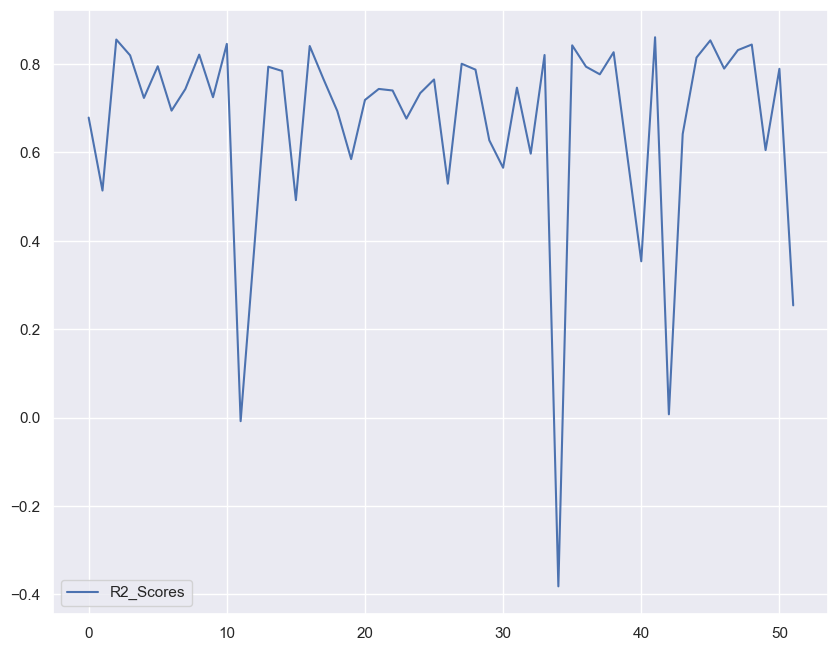

In [124]:
df_state_accuracy_score.plot()

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51],
 <a list of 52 Text xticklabel objects>)

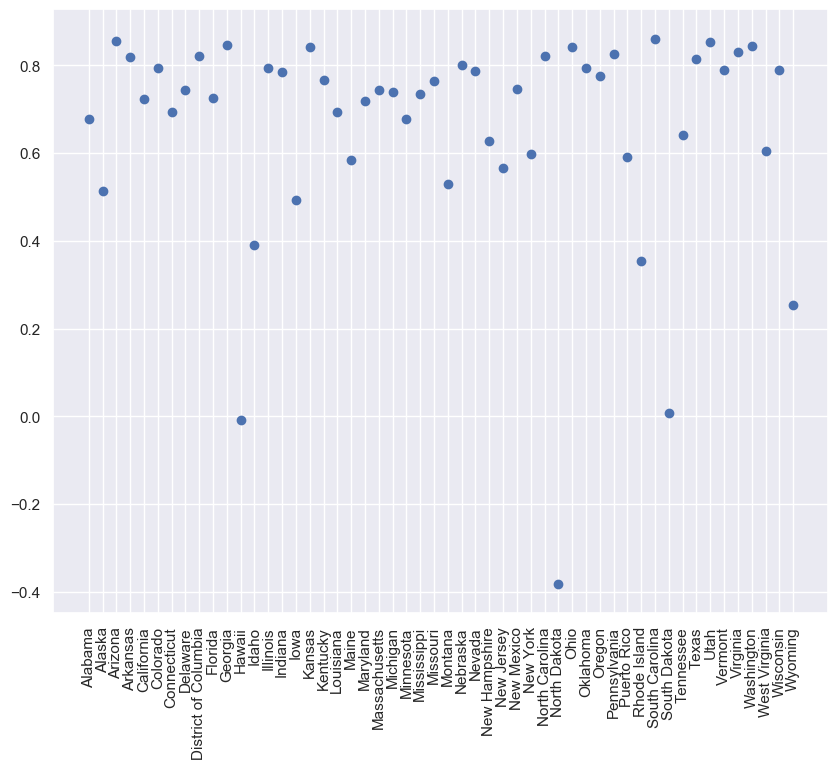

In [127]:
plt.scatter(df_state_accuracy_score['States'],df_state_accuracy_score['R2_Scores'], marker='o')
plt.xticks(rotation=90)